# Project Information

**Course Name**: DS203: Programming for Data Science

**Project Name**: Analysis of NASA's 5 Millenium Solar Eclipe Database

**Dataset Name**: [NASA's 5 Millenium Solar Eclipse Database](https://eclipse.gsfc.nasa.gov/SEcat5/catalog.html)

**Processed Dataset Source**: [Processed Data Source](https://docs.google.com/spreadsheets/d/1Q-ciiPv4l4YsRJPm9FnCzNhNMo6gGvZ8OrbPPfKokcI/edit?usp=sharing)

**Members**:
- Soham S. Phanse$^1$
- Pranjal Gupta$^1$

$^1$Department of Aerospace Engineering, IIT Bombay

# Library Installation and Imports

In [ ]:
# Library imports

## data
import numpy as np
import pandas as pd
import scipy

## visualization
import matplotlib.pyplot as plt
import seaborn as sns

## ML 
import sklearn as skl
import torch

## interactive
from ipywidgets import interact, interactive, interact_manual, interactive_output

# Dataset Import

In [ ]:
from google.colab import auth
auth.authenticate_user()

import gspread
from oauth2client.client import GoogleCredentials

gc = gspread.authorize(GoogleCredentials.get_application_default())

worksheet = gc.open('PIS_DS203: 5 Millenium Solar Eclipse Database').sheet1

# get_all_values gives a list of rows.
rows = worksheet.get_all_values()
rows = np.array(rows)

In [ ]:
df = pd.DataFrame(rows[1:, 1:], columns=rows[0, 1:], index=rows[1:, 0])
df.head()

,Canon_Plate,Year_(t=0@0AD),Month,Date,Days_from_the_last_eclipse,TDGE_from_00:00,DT_(s),Luna_Num,Saros_Num,Eclipse_Type,Gamma,Eclipse_Magnitude,Latitude,Longitude,Sun_Alt,Sun_Az,path_width,Total_Central_Duration_(s)
1,1,-1999,6,12,0,11691,46438,-49456,5,T,-0.2701,1.0733,6,-33.3,74,344,247,397
2,1,-1999,12,5,176,85523,46426,-49450,10,A,-0.2317,0.9382,-32.9,10.8,76,21,236,404
3,1,-1998,6,1,187,65356,46415,-49444,15,T,0.4994,1.0284,46.2,83.4,60,151,111,135
4,1,-1998,11,25,177,21423,46403,-49438,20,A,-0.9045,0.9806,-67.8,-143.8,25,74,162,74
5,1,-1997,4,22,217,47996,46393,-49433,-13,P,-1.467,0.1611,-60.6,-106.4,,281,,


In [ ]:
df_report = pd.DataFrame(rows[1:, 1:], columns=rows[1, 1:], index=rows[1:, 0])
df_report.head()

,1,-1999,6,12,0,11691,46438,-49456,5,T,-0.2701,1.0733,6,-33.3,74,344,247,397
1,1,-1999,6,12,0,11691,46438,-49456,5,T,-0.2701,1.0733,6,-33.3,74,344,247,397
2,1,-1999,12,5,176,85523,46426,-49450,10,A,-0.2317,0.9382,-32.9,10.8,76,21,236,404
3,1,-1998,6,1,187,65356,46415,-49444,15,T,0.4994,1.0284,46.2,83.4,60,151,111,135
4,1,-1998,11,25,177,21423,46403,-49438,20,A,-0.9045,0.9806,-67.8,-143.8,25,74,162,74
5,1,-1997,4,22,217,47996,46393,-49433,-13,P,-1.467,0.1611,-60.6,-106.4,,281,,


In [ ]:
columns = np.array(df.columns)
columns

array(['Canon_Plate', 'Year_(t=0@0AD)', 'Month', 'Date',
       'Days_from_the_last_eclipse', 'TDGE_from_00:00', 'DT_(s)',
       'Luna_Num', 'Saros_Num', 'Eclipse_Type', 'Gamma',
       'Eclipse_Magnitude', 'Latitude', 'Longitude', 'Sun_Alt', 'Sun_Az',
       'path_width', 'Total_Central_Duration_(s)'], dtype=object)

# Variable Information
Before we proceed with the analysis we give a brief information on each of the variables. The official NASA Page can be found here: [KEY TO CATALOG OF SOLAR ECLIPSES](https://eclipse.gsfc.nasa.gov/SEcat5/SEcatkey.html)

## Catalog Number
Sequential number of the eclipse in the catalog links to the map published in the [Five Millennium Canon of Solar Eclipses: -1999 to +3000](https://eclipse.gsfc.nasa.gov/SEpubs/5MCSE.html)

## Canon Plate


## Eclipse Date
- Calendar Date at instant of Greatest Eclipse. 
- Gregorian Calendar is used for dates after 1582 Oct 15. - Julian Calendar is used for dates before 1582 Oct 04.   

<!--### Calendar Year

### Calendar Month

### Calendar Date-->

## TD of Greatest Eclipse
Dynamical Time (TD) of Greatest Eclipse, the instant when the axis of the Moon's shadow cone passes closest Eclipse to Earth's center.

## $\Delta$T(s) or DT(s)
- Delta T (ΔT) is the arithmetic difference between Dynamical Time and Universal Time. It is a measure of the accumulated clock error due to the variable rotation period of Earth.
- The orbital positions of the Sun and Moon required by eclipse predictions, are calculated using Terrestrial Dynamical Time (TD) because it is a uniform time scale.-  However, world time zones and daily life are based on Universal Time[1] (UT). 
- In order to convert eclipse predictions from TD to UT, the difference between these two time scales must be known. 
- The parameter delta-T (ΔT) is the arithmetic difference, in seconds, between the two as:
$$ ΔT = TD - UT $$
- Find more information [here](https://eclipse.gsfc.nasa.gov/SEcat5/deltat.html)

## Luna Num (Lunation Number)
- Lunation Number is the number of synodic months since New Moon of 2000 Jan 06. The Brown Lunation Number can be determined by adding 953.

## Saros Num
Saros series number of eclipse. (Each eclipse in a Saros is separated by an interval of 18 years 11.3 days.)

## Eclipse Type 

### First Character (Eclispe_Type_1)
- P  = Partial Eclipse.
- A  = Annular Eclipse.
- T  = Total Eclipse.
- H  = Hybrid or Annular/Total Eclipse.

### Second Character (Eclispe_Type_1)
- "m" = Middle eclipse of Saros series.
- "n" = Central eclipse with no northern limit.
- "s" = Central eclipse with no southern limit.
- "+" = Non-central eclipse with no northern limit.
- "-" = Non-central eclipse with no southern limit.
- "2" = Hybrid path begins total and ends annular.
- "3" = Hybrid path begins annular and ends total.
- "b" = Saros series begins (first eclipse in series).
- "e" = Saros series ends (last eclipse in series).

## QLE
Quincena Lunar Eclipse parameter identifies the type of lunar eclipse that precedes and/or succeeds a solar eclipse where:
- n = penumbral lunar eclipse (Moon passes partly or completely within Earth's penumbral shadow)
- p = partial lunar eclipse (Moon passes partly within Earth's umbral shadow)
- t = total lunar eclipse (Moon passes completely within Earth's umbral shadow)

## Gamma (unitless)
Distance of the shadow cone axis from the center of Earth (units of equatorial radii) at the instant of greatest eclipse.

## Eclipse Magnitude (unitless)
Eclipse magnitude is the fraction of the Sun's diameter obscured by the Moon. For annular, total and hybrid eclipses, this value is actually the diameter ratio of Moon/Sun.

## Latitude (in degrees)
- Latitude where greatest eclipse is seen.
- Only eclipses with non-zero central duration are considered in the following analysis.
- The geographic latitude and longitude corresponds to the position of greatest eclipse.
- Negative values correspond to the Southern Hemisphere and Positive Values to the Northern Hemisphere. 
- '0' corresponds to the Equator.

## Longitude (in degrees)
Longitude where greatest eclipse is seen.

## Sun Altitude (in degrees)
Sun's altitude at greatest eclipse.

## Sun Azimuth (in degrees)
Sun's azimuth at greatest eclipse.

## Path width (in km)
Width of the path of totality or annularity Width at greatest eclipse (kilometers).

## Total Central Duration (in seconds)
- Central Line Duration of total or annular phase at greatest eclipse.
- For central eclipses (total, annular, or hybrid), the central line duration of the total or annular phase (in minutes and seconds) is given at the geographic
position intersected by the axis of the lunar shadow cone at the instant of greatest eclipse.
- In the case of a total or hybrid eclipse, this duration is very nearly, the maximum duration of the total phase along the entire umbral path.
- For an annular eclipse, the duration at the greatest eclipse may be near either the minimum or maximum duration of the annular phase along the path.

# Dataset Pre-processing

In [ ]:
# Quantifying Calendar Month
## Changing from gregorian name to numeric type

#df = df.replace(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])

# TD of Greatest Eclipse
## Converting time given in 24 hour format to seconds from 00:00:00 for better visualization and quantification. 
'''
TD_eclipse = df['TD of Greatest Eclipse']
lTD_eclipse = len(TD_eclipse)
col2 = np.zeros(lTD_eclipse)
error_log = np.zeros_like(TD_eclipse)
for j in range(lTD_eclipse):
  # convert string into float by split()
  float_time = [float(each) for each in TD_eclipse[j].split(':')]
  
  # add validation step
  val_bool = [((float_time[0]<24) and (float_time[0]>=0)) and ((float_time[1]<=59) and (float_time[1]>=0)) and ((float_time[2]<=59) and (float_time[2]>=0))]
  if not val_bool:
    error_log[j] = 1
  
  # use col2 array
  col2[j] = float_time[0]*3600 + float_time[1]*60 + float_time[2]

df['TD of Greatest Eclipse'] = col2
df = df.rename(columns={"TD of Greatest Eclipse":"TDGEfrom_00:00"}, errors="raise")
'''

# Quantifying Latitude and Longitude

## Latitude
### For Latitude we give positive values for the eastern hemisphere and negative in the western.

## Longitude
### For longitude we give positive values for the Northern hemisphere and negative in the southern.

'''
for k in range(len(df)):
  lat = df['Latitude'][k]
  lon = df['Longitude'][k]
  hemi_NS = lat[-1]
  hemi_EW = lon[-1]
  if hemi_NS.capitalize()=='S':
    df['Latitude'][k] = -1*float(lat[:-1])
  else:
    df['Latitude'][k] = float(lat[:-1])
  if hemi_EW.capitalize()=='W':
    df['Longitude'][k] = -1*float(lon[:-1])
  else:
    df['Longitude'][k] = float(lon[:-1])
'''
  
# Simplifying Eclipse Type
TOL = 1e-3
etype = np.array(df['Eclipse_Type'])
etype1, etype2 = np.zeros_like(etype), np.zeros_like(etype)
for i in range(len(etype)):
  if abs(len(etype[i])-1)<TOL:
    etype1[i] = etype[i][0]
  else:
    etype1[i] = etype[i][0]
    etype2[i] = etype[i][-1]

df.insert(9, value=etype1, column='Eclipse_Type_1')
df.insert(10, value=etype2, column='Eclipse_Type_2')

In [ ]:
df.head()

,Canon_Plate,Year_(t=0@0AD),Month,Date,Days_from_the_last_eclipse,TDGE_from_00:00,DT_(s),Luna_Num,Saros_Num,Eclipse_Type_1,Eclipse_Type_2,Eclipse_Type,Gamma,Eclipse_Magnitude,Latitude,Longitude,Sun_Alt,Sun_Az,path_width,Total_Central_Duration_(s)
1,1,-1999,6,12,0,11691,46438,-49456,5,T,0,T,-0.2701,1.0733,6,-33.3,74,344,247,397
2,1,-1999,12,5,176,85523,46426,-49450,10,A,0,A,-0.2317,0.9382,-32.9,10.8,76,21,236,404
3,1,-1998,6,1,187,65356,46415,-49444,15,T,0,T,0.4994,1.0284,46.2,83.4,60,151,111,135
4,1,-1998,11,25,177,21423,46403,-49438,20,A,0,A,-0.9045,0.9806,-67.8,-143.8,25,74,162,74
5,1,-1997,4,22,217,47996,46393,-49433,-13,P,0,P,-1.467,0.1611,-60.6,-106.4,,281,,


In [ ]:
float_columns = ['Canon_Plate', 'Year_(t=0@0AD)', 'Month', 'Date', 'Days_from_the_last_eclipse', 'TDGE_from_00:00', 'DT_(s)', 'Luna_Num', 'Saros_Num', 'Gamma', 'Eclipse_Magnitude', 'Latitude', 'Longitude', 'Sun_Az']

In [ ]:
for each in float_columns:
  df[each] = np.array([float(every) for every in df[each]])

In [ ]:
alt = []
for each in df['Sun_Alt']:
  try:
    alt.append(float(each))
  except:
    alt.append(0)

df['Sun_Alt'] = np.array(alt)

dur = []
for each in df['Total_Central_Duration_(s)']:
  try:
    dur.append(float(each))
  except:
    dur.append(0)
  
df['Total_Central_Duration_(s)'] = np.array(dur)

path = []
for each in df['path_width']:
  try:
    path.append(float(each))
  except:
    path.append(0)

df['path_width'] = np.array(path)
df.head()

,Canon_Plate,Year_(t=0@0AD),Month,Date,Days_from_the_last_eclipse,TDGE_from_00:00,DT_(s),Luna_Num,Saros_Num,Eclipse_Type_1,Eclipse_Type_2,Eclipse_Type,Gamma,Eclipse_Magnitude,Latitude,Longitude,Sun_Alt,Sun_Az,path_width,Total_Central_Duration_(s)
1,1.0,-1999.0,6.0,12.0,0.0,11691.0,46438.0,-49456.0,5.0,T,0,T,-0.2701,1.0733,6.0,-33.3,74.0,344.0,247.0,397.0
2,1.0,-1999.0,12.0,5.0,176.0,85523.0,46426.0,-49450.0,10.0,A,0,A,-0.2317,0.9382,-32.9,10.8,76.0,21.0,236.0,404.0
3,1.0,-1998.0,6.0,1.0,187.0,65356.0,46415.0,-49444.0,15.0,T,0,T,0.4994,1.0284,46.2,83.4,60.0,151.0,111.0,135.0
4,1.0,-1998.0,11.0,25.0,177.0,21423.0,46403.0,-49438.0,20.0,A,0,A,-0.9045,0.9806,-67.8,-143.8,25.0,74.0,162.0,74.0
5,1.0,-1997.0,4.0,22.0,217.0,47996.0,46393.0,-49433.0,-13.0,P,0,P,-1.4670,0.1611,-60.6,-106.4,0.0,281.0,0.0,0.0


# Data Visualization

In [ ]:
def normalize_array(list_of_arr):
  return_arr_list = []
  for each in list_of_arr:
    n = np.linalg.norm(each)
    return_arr_list.append(each/n)
  return np.transpose(np.array(return_arr_list))

In [ ]:
df.head()

,Canon_Plate,Year_(t=0@0AD),Month,Date,Days_from_the_last_eclipse,TDGE_from_00:00,DT_(s),Luna_Num,Saros_Num,Eclipse_Type_1,Eclipse_Type_2,Eclipse_Type,Gamma,Eclipse_Magnitude,Latitude,Longitude,Sun_Alt,Sun_Az,path_width,Total_Central_Duration_(s)
1,1.0,-1999.0,6.0,12.0,0.0,11691.0,46438.0,-49456.0,5.0,T,0,T,-0.2701,1.0733,6.0,-33.3,74.0,344.0,247.0,397.0
2,1.0,-1999.0,12.0,5.0,176.0,85523.0,46426.0,-49450.0,10.0,A,0,A,-0.2317,0.9382,-32.9,10.8,76.0,21.0,236.0,404.0
3,1.0,-1998.0,6.0,1.0,187.0,65356.0,46415.0,-49444.0,15.0,T,0,T,0.4994,1.0284,46.2,83.4,60.0,151.0,111.0,135.0
4,1.0,-1998.0,11.0,25.0,177.0,21423.0,46403.0,-49438.0,20.0,A,0,A,-0.9045,0.9806,-67.8,-143.8,25.0,74.0,162.0,74.0
5,1.0,-1997.0,4.0,22.0,217.0,47996.0,46393.0,-49433.0,-13.0,P,0,P,-1.4670,0.1611,-60.6,-106.4,0.0,281.0,0.0,0.0


In [ ]:
df_heatmap = df[['Days_from_the_last_eclipse', 'TDGE_from_00:00', 'DT_(s)', 'Luna_Num', 'Saros_Num', 'Gamma', 'Eclipse_Magnitude', 'Latitude', 'Longitude', 'Sun_Az', 'Sun_Alt', 'path_width', 'Total_Central_Duration_(s)']]
df_heatmap = df_heatmap[df_heatmap['Sun_Alt']!=0]
df_heatmap = df_heatmap[df_heatmap['path_width']!=0]
df_heatmap = df_heatmap[df_heatmap['Total_Central_Duration_(s)']!=0]
df_heatmap

,Days_from_the_last_eclipse,TDGE_from_00:00,DT_(s),Luna_Num,Saros_Num,Gamma,Eclipse_Magnitude,Latitude,Longitude,Sun_Az,Sun_Alt,path_width,Total_Central_Duration_(s)
1,0.0,11691.0,46438.0,-49456.0,5.0,-0.2701,1.0733,6.0,-33.3,344.0,74.0,247.0,397.0
2,176.0,85523.0,46426.0,-49450.0,10.0,-0.2317,0.9382,-32.9,10.8,21.0,76.0,236.0,404.0
3,187.0,65356.0,46415.0,-49444.0,15.0,0.4994,1.0284,46.2,83.4,151.0,60.0,111.0,135.0
4,177.0,21423.0,46403.0,-49438.0,20.0,-0.9045,0.9806,-67.8,-143.8,74.0,25.0,162.0,74.0
9,218.0,50092.0,46369.0,-49421.0,-3.0,-0.7231,0.9464,-38.2,-167.2,321.0,43.0,277.0,311.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11882,177.0,44268.0,4378.0,12296.0,175.0,0.5777,0.9422,24.5,-1.0,149.0,55.0,256.0,366.0
11888,147.0,78278.0,4392.0,12319.0,157.0,-0.8345,1.0397,-72.9,-81.5,308.0,33.0,243.0,140.0
11889,177.0,85443.0,4395.0,12325.0,162.0,0.5013,0.9508,51.6,-145.6,199.0,60.0,208.0,284.0
11892,177.0,85515.0,4406.0,12343.0,177.0,0.5449,0.9696,9.6,-161.9,175.0,57.0,130.0,220.0


## Eclipse Type Distribution

In [ ]:
# eclipse types
p = np.array(df['Eclipse_Type_1'])
s = np.array(df['Eclipse_Type_2'])

## narrow down to primary and secondary characteristics of eclipse
primary = list(set(df['Eclipse_Type_1']))
secondary = list(set(df['Eclipse_Type_2']))
plen, slen = len(primary), len(secondary)
counts = np.zeros((int(plen), int(slen)))

for j in range(len(df)):
  t1, t2 = p[j], s[j]
  i1, i2 = list(primary).index(t1), list(secondary).index(t2)
  counts[i1, i2] += 1 

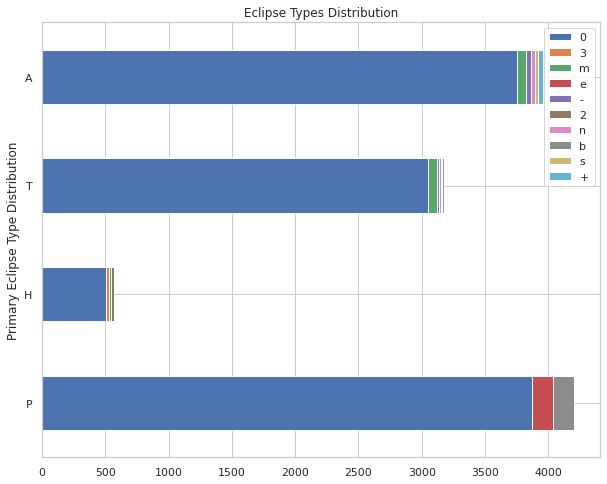

In [ ]:
ecltype = pd.DataFrame(counts, index=primary, columns=secondary)
ecltype.plot(xlabel='Primary Eclipse Type Distribution', ylabel='Number of Occurences', title='Eclipse Types Distribution', kind='barh', stacked=True, figsize=(10, 8));


## Eclipse Locations around the Globe




In [ ]:
a = set([each for each in df['Eclipse_Type_1']])

In [ ]:
def eclipse_globe(string):
  sns.set_theme(style="whitegrid")
  plt.figure(figsize=(25, 15))

  if string.capitalize()=='All':
    sns.scatterplot(data=df, x='Longitude', y='Latitude', hue=df['Eclipse_Type_1'], size=np.array(df['Eclipse_Magnitude'])*5, sizes=(10, 50), style=df['Eclipse_Type_2'])
    plt.title('Eclipse Locations Around the Globe', fontsize=20)
    plt.ylabel('Latitude', fontsize=20)
    plt.xlabel('Longitude', fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.legend(title='Legend \n(Pri.Ecl. \nType \n& Mag)')
    plt.hlines(0, -180, 180, linestyle='--', linewidth=2, color='r')
    plt.vlines(0, -90, 90, linestyle='--', linewidth=2, color='g')
    plt.plot(72.8, 19, 'x', markersize=20)
    plt.annotate(s='Mumbai, India', xy=(72.8, 19), fontsize=25);
  
  else:
    string = string.capitalize()
    df1 = df[df['Eclipse_Type_1']==string]
    sns.scatterplot(data=df1, x='Longitude', y='Latitude', hue=df1['Eclipse_Type_1'], size=np.array(df1['Eclipse_Magnitude'])*5, sizes=(10, 50), style=df1['Eclipse_Type_2'])
    plt.title('Eclipse Locations Around the Globe', fontsize=20)
    plt.ylabel('Latitude', fontsize=20)
    plt.xlabel('Longitude', fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.legend(title='Legend \n(Pri.Ecl. \nType \n& Mag)')
    plt.hlines(0, -180, 180, linestyle='--', linewidth=2, color='r')
    plt.vlines(0, -90, 90, linestyle='--', linewidth=2, color='g')
    plt.plot(72.8, 19, 'x', markersize=20)
    plt.annotate(s='Mumbai, India', xy=(72.8, 19), fontsize=25);

In [ ]:
# Allowed arguments for interact

## h = Hybrid Eclipses

## t = Total Eclipses

## p = Partial Eclipses

## a = Annular Eclipses

interact(eclipse_globe, string='all')

interactive(children=(Text(value='all', description='string'), Output()), _dom_classes=('widget-interact',))

<function __main__.eclipse_globe>

## Eclipse Path Width

In [ ]:
def plot_path_width(string):
  string = string.capitalize()
  if len(string)<=1:
    string = [every.capitalize() for every in string]
  if string=='All':
    plt.figure(figsize=(15, 10))
    sns.scatterplot(data=df, x='path_width', y='Latitude', hue = df['Eclipse_Type_1'], size='Eclipse_Magnitude', style=df['Eclipse_Type_2'])
    plt.xlabel('Path Width in km', fontsize=15)
    plt.ylabel('Latitude', fontsize=15);
    plt.title('Path Width Distribution', fontsize=15)
  else:
    plt.figure(figsize=(15, 8))
    for each in string:
      df1 = df[df['Eclipse_Type_1']==each]
      sns.scatterplot(data=df1, x='path_width', y='Latitude', hue='Eclipse_Type_2', size='Eclipse_Magnitude')
      plt.xlabel('Path Width of %s Eclipes'%string, fontsize=15)
      plt.ylabel('Latitude', fontsize=15)
      plt.title('Path Width Distribution', fontsize=15)

In [ ]:
# Allowed arguments for interact

## h = Hybrid Eclipses

## t = Total Eclipses

## p = Partial Eclipses

## a = Annular Eclipses

interact(plot_path_width, string='all');

interactive(children=(Text(value='all', description='string'), Output()), _dom_classes=('widget-interact',))

## Co-relation HeatMap


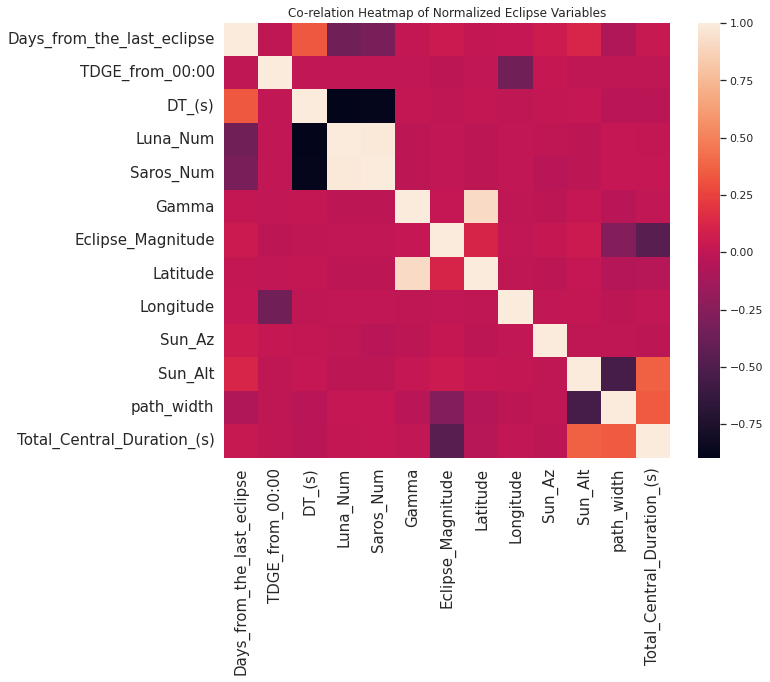

In [ ]:
ax = plt.figure(figsize=(10, 8))
sns.heatmap(df_heatmap.corr(method='pearson')) #, columns=).corr(method='pearson'), annot=True, center=0)
plt.title('Co-relation Heatmap of Normalized Eclipse Variables');
plt.xticks(fontsize=15, rotation = 90);
plt.yticks(fontsize=15);

# Distribution Fitting

## Days between 2 consecutive Eclipses

In [ ]:
from scipy.stats import *

In [ ]:
dbce = df[df['Days_from_the_last_eclipse']!=0]

In [ ]:
mu, sig = norm.fit(dbce['Days_from_the_last_eclipse'])

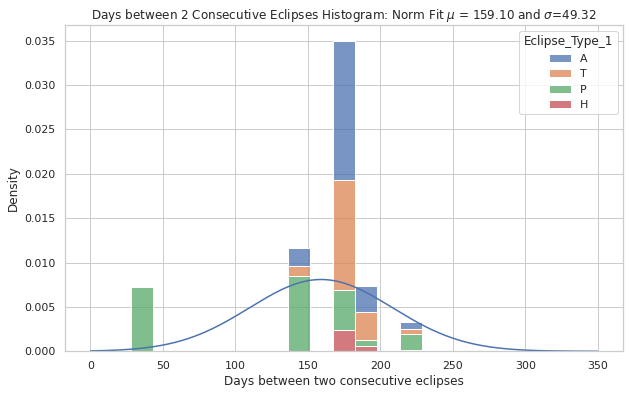

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(data=dbce, x = 'Days_from_the_last_eclipse', bins=20, hue='Eclipse_Type_1', multiple='stack', stat='density')
bins = np.linspace(0, 350, 1500)
plt.plot(bins, norm(mu, sig).pdf(bins))
plt.xlabel('Days between two consecutive eclipses');
plt.title('Days between 2 Consecutive Eclipses Histogram: Norm Fit $\mu$ = %.2f and $\sigma$=%.2f'%(mu, sig));

## Eclipse_Magnitude

In [ ]:
amg, bmg, cmg = gamma.fit(df['Eclipse_Magnitude'])

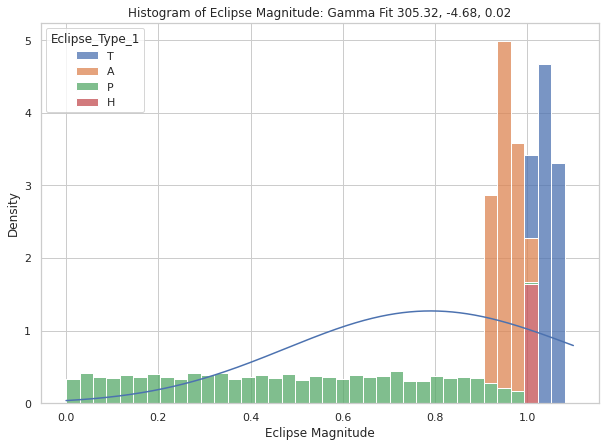

In [ ]:
bin = np.linspace(0, 1.1, 1000)
plt.figure(figsize=(10, 7))
sns.histplot(data=df, x='Eclipse_Magnitude', hue='Eclipse_Type_1', multiple='stack', stat='density')
plt.plot(bin, gamma(amg, bmg, cmg).pdf(bin))
plt.xlabel('Eclipse Magnitude');
plt.title('Histogram of Eclipse Magnitude: Gamma Fit %.2f, %.2f, %.2f'%(amg, bmg, cmg));

## Eclipse Location

### Longitude

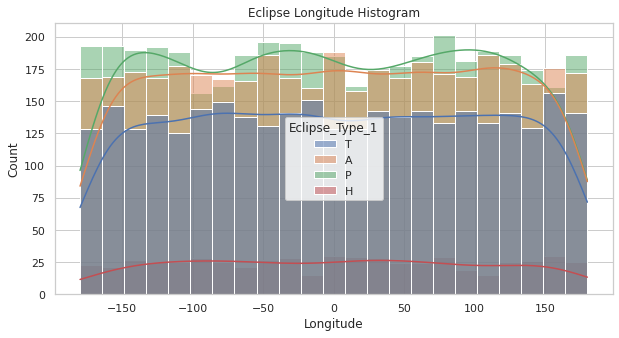

In [ ]:
plt.figure(figsize=(10, 5))
sns.histplot(data=df, x='Longitude', hue='Eclipse_Type_1', kde=True);
plt.title('Eclipse Longitude Histogram');

### Latitude

#### All

In [ ]:
a, b, c = dweibull.fit(df['Latitude'])

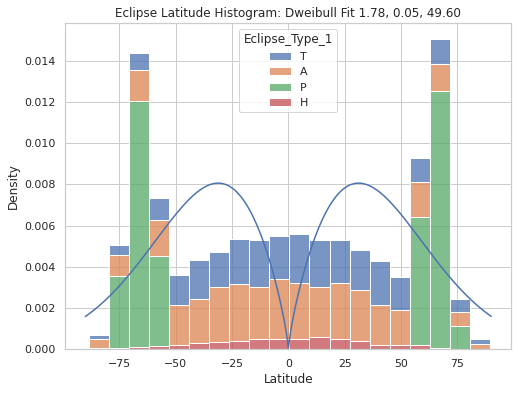

In [ ]:
bins = np.linspace(-90, 90, 1000)
plt.figure(figsize=(8, 6))
sns.histplot(data=df, x='Latitude', hue='Eclipse_Type_1', stat='density', multiple='stack')
plt.plot(bins, dweibull(a,b,c).pdf(bins));
plt.title('Eclipse Latitude Histogram: Dweibull Fit %.2f, %.2f, %.2f'%(a, b, c));

#### Non-Partial Eclipses

If we don't consider the outliers like the partial eclipse then we get, as follows

In [ ]:
dflat = df[df['Eclipse_Type_1']!='P']
mulat, siglat = norm.fit(dflat['Latitude'])

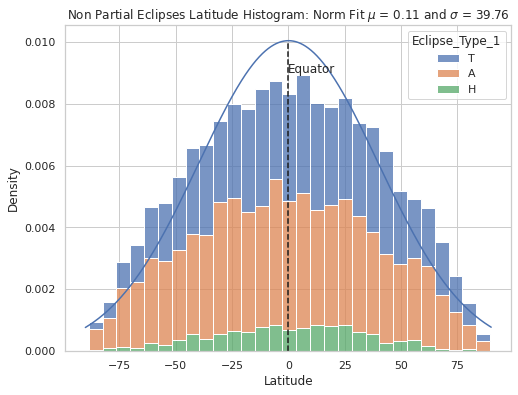

In [ ]:
bin = np.linspace(-90, 90, 1000)
plt.figure(figsize=(8, 6))
sns.histplot(data = dflat, x='Latitude', stat='density', hue=dflat['Eclipse_Type_1'], multiple='stack')
plt.plot(bin, norm(mulat, siglat).pdf(bin))
plt.title('Non Partial Eclipses Latitude Histogram: Norm Fit $\mu$ = %.2f and $\sigma$ = %.2f'%(mulat, siglat))
plt.xlabel('Latitude')
plt.vlines(0, 0.0, 0.01, label='Equator', linestyle='--')
plt.annotate(xy=(0, 0.009), s='Equator');

#### Partial Eclipses

In [ ]:
dpart = df[df['Eclipse_Type_1']=='P']
apart, bpart, cpart = dweibull.fit(dpart['Latitude'])

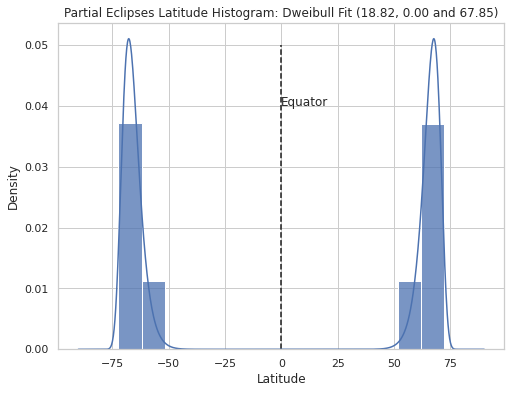

In [ ]:
bin = np.linspace(-90, 90, 1000)
plt.figure(figsize=(8, 6))
sns.histplot(data = dpart, x='Latitude', stat='density')
plt.plot(bin, dweibull(apart, bpart, cpart).pdf(bin));
plt.title('Partial Eclipses Latitude Histogram: Dweibull Fit (%.2f, %.2f and %.2f)'%(apart, bpart, cpart))
plt.xlabel('Latitude')
plt.vlines(0, 0.0, 0.05, linestyle='--')
plt.annotate(xy=(0, 0.04), s='Equator');

### Both Together

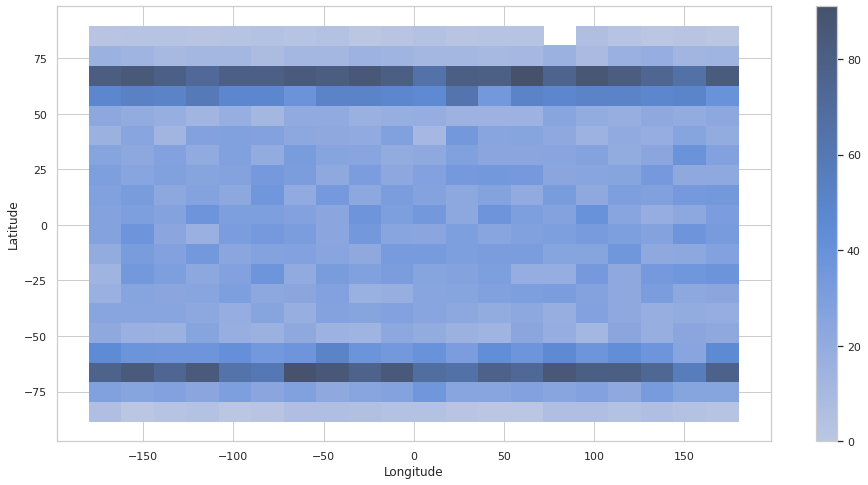

In [ ]:
plt.figure(figsize=(16, 8))
sns.histplot(data=df, x='Longitude', y='Latitude', bins=20, cbar=True);

## Gamma

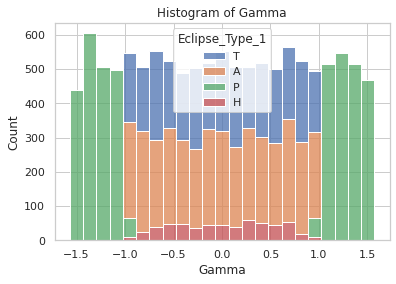

In [ ]:
sns.histplot(data=df, x='Gamma', hue='Eclipse_Type_1', multiple='stack');
plt.title('Histogram of Gamma');

### The Linearity and Symmetry with the Latitude 

Text(0.5, 1.0, 'Scatter: Gamma and Latitude')

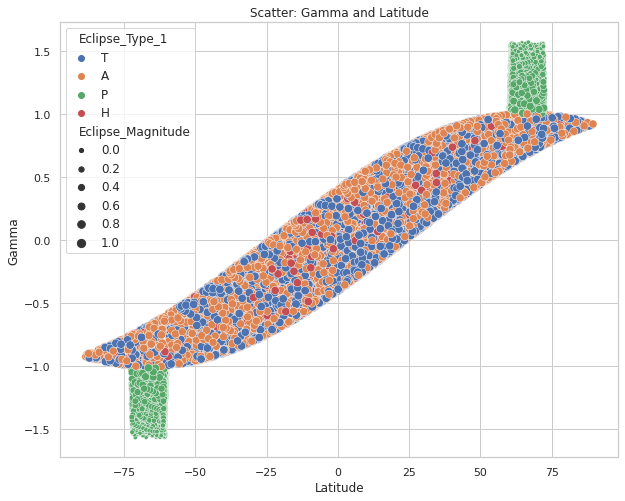

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x=df['Latitude'], y=df['Gamma'], hue=df['Eclipse_Type_1'], size=df['Eclipse_Magnitude']);
plt.title('Scatter: Gamma and Latitude')

## Sun Azimuth

### Non Partial Eclipses

In [ ]:
daz = df[df['Eclipse_Type_1']!='P']

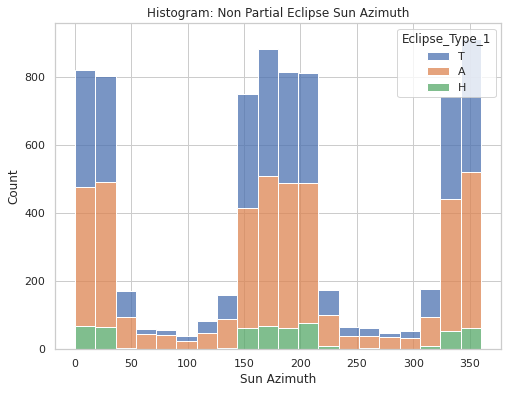

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data=daz, x='Sun_Az', hue='Eclipse_Type_1', multiple='stack')
plt.title('Histogram: Non Partial Eclipse Sun Azimuth')
plt.xlabel('Sun Azimuth');

### Partial Eclipses

In [ ]:
dnaz = df[df['Eclipse_Type_1']=='P']

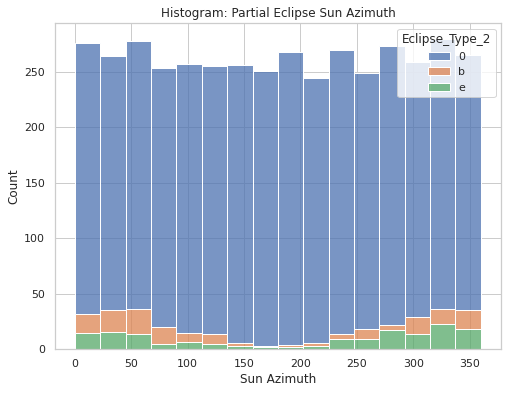

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data=dnaz, x='Sun_Az', hue='Eclipse_Type_2', multiple='stack')
plt.title('Histogram: Partial Eclipse Sun Azimuth')
plt.xlabel('Sun Azimuth');

## Sun Altitude

In [ ]:
dsalt = df[df['Sun_Alt']!=0]
aalt, balt, calt = gamma.fit(dsalt['Sun_Alt'])

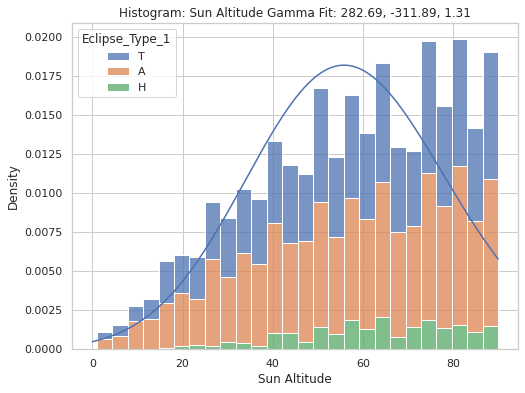

In [ ]:
bins = np.linspace(0, 90, 1000)
plt.figure(figsize=(8, 6))
sns.histplot(data=dsalt, x='Sun_Alt', stat='density', hue='Eclipse_Type_1', multiple='stack')
plt.plot(bins, gamma(aalt, balt, calt).pdf(bins))
plt.title('Histogram: Sun Altitude Gamma Fit: %.2f, %.2f, %.2f'%(aalt, balt, calt))
plt.xlabel('Sun Altitude');

## Path Width

In [ ]:
dpath = df[df['path_width']!=0]

In [ ]:
a, b, c = gamma.fit(dpath['path_width'])

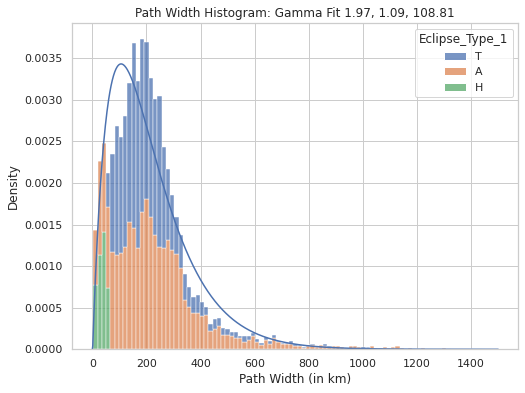

In [ ]:
bin = np.linspace(0, 1500, 1000)
plt.figure(figsize=(8, 6))
sns.histplot(data=dpath, x='path_width', hue='Eclipse_Type_1', multiple='stack', stat='density')
plt.plot(bin, gamma(a, b, c).pdf(bin))
plt.title('Path Width Histogram: Gamma Fit %.2f, %.2f, %.2f'%(a, b, c))
plt.xlabel('Path Width (in km)');

## Total Central Duration in Seconds

In [ ]:
ddur = df[df['Total_Central_Duration_(s)']!=0]

In [ ]:
mudur, sigdur = norm.fit(ddur['Total_Central_Duration_(s)'])
adur, bdur, cdur = gamma.fit(ddur['Total_Central_Duration_(s)'])

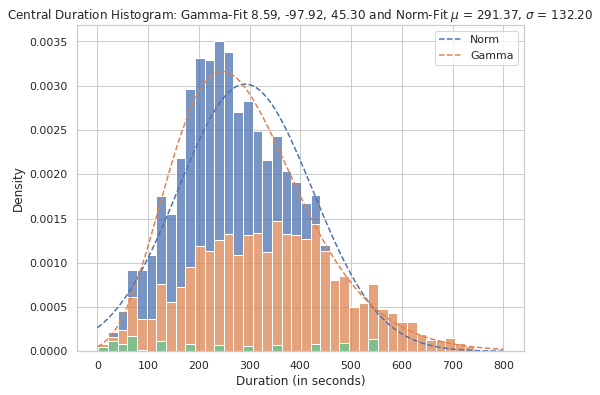

In [ ]:
bin = np.linspace(0, 800, 1000)
plt.figure(figsize=(8, 6))
sns.histplot(data=ddur, x='Total_Central_Duration_(s)', hue='Eclipse_Type_1', multiple='stack', stat='density', legend='brief')
plt.plot(bin, norm(mudur, sigdur).pdf(bin), label='a', linestyle='--')
plt.plot(bin, gamma(adur, bdur, cdur).pdf(bin), linestyle='--')
plt.title('Central Duration Histogram: Gamma-Fit %.2f, %.2f, %.2f and Norm-Fit $\mu$ = %.2f, $\sigma$ = %.2f'%(adur, bdur, cdur, mudur, sigdur))
plt.xlabel('Duration (in seconds)');
plt.legend(['Norm', 'Gamma']);

## Lunar Number vs Saros Series Number

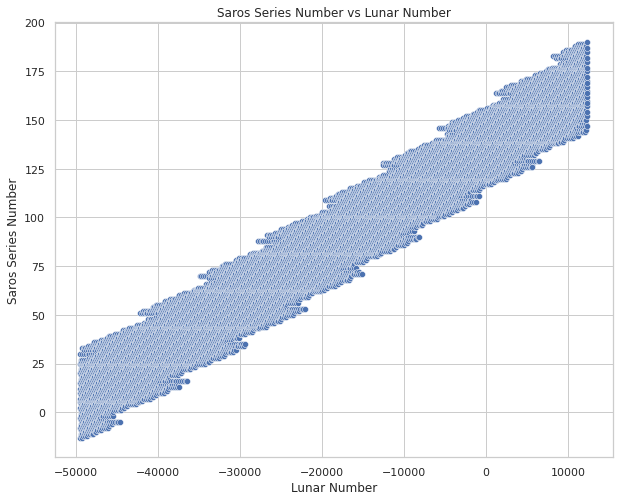

In [ ]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x='Luna_Num', y='Saros_Num')
plt.xlabel('Lunar Number')
plt.ylabel('Saros Series Number')
plt.title('Saros Series Number vs Lunar Number');

# Regression

In [ ]:
regression = ['Days_from_the_last_eclipse', 'TDGE_from_00:00', 'DT_(s)', 'Luna_Num',
       'Saros_Num', 'Gamma', 'Eclipse_Magnitude', 'Latitude', 'Longitude',
       'Sun_Az', 'Sun_Alt', 'path_width']

In [ ]:
regression2 = ['Days_from_the_last_eclipse', 'TDGE_from_00:00', 'DT_(s)', 'Luna_Num',
       'Saros_Num', 'Gamma', 'Eclipse_Magnitude', 'Latitude', 'Longitude',
       'Sun_Az', 'Sun_Alt', 'path_width', 'Total_Central_Duration_(s)']

In [ ]:
dfX, dfy = df['Total_Central_Duration_(s)'], df['path_width']
from sklearn.model_selection import train_test_split
## train and test split
X_train, X_test, y_train, y_test = train_test_split(dfX, dfy, test_size=0.20)
X_train = np.array(X_train).reshape(-1,1)
from sklearn.linear_model import LinearRegression
lin = LinearRegression()
lin.fit(X_train, y_train)

LinearRegression()

Text(0.5, 1.0, 'Linear Regression')

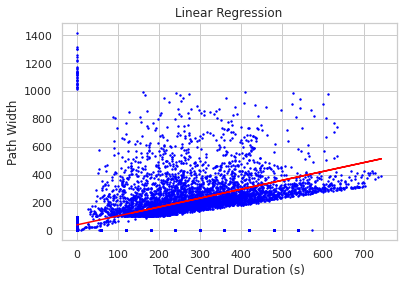

In [ ]:
plt.scatter(X_train, y_train, color = 'blue', s=2)
plt.plot(X_train, lin.predict(X_train), color='red')
plt.xlabel('Total Central Duration (s)')
plt.ylabel('Path Width')
plt.title('Linear Regression')

Text(0, 0.5, 'Eclipse Magnitude')

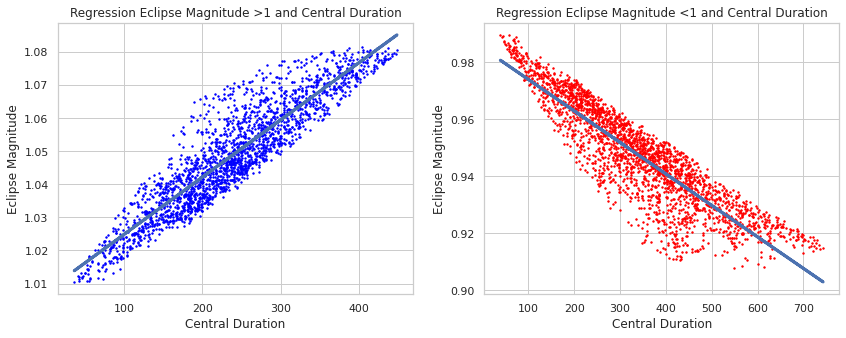

In [ ]:
df_mag_dur = df[df['Total_Central_Duration_(s)']>5]

df_mag_dur1 = df_mag_dur[df_mag_dur['Eclipse_Magnitude']>1.01]
df_mag_dur2 = df_mag_dur[df_mag_dur['Eclipse_Magnitude']<0.99]

dfX1, dfy1 = df_mag_dur1['Total_Central_Duration_(s)'], df_mag_dur1['Eclipse_Magnitude']
dfX2, dfy2 = df_mag_dur2['Total_Central_Duration_(s)'], df_mag_dur2['Eclipse_Magnitude']

df_mag_dur = df[df['Total_Central_Duration_(s)']>5]
df_mag_dur1 = df_mag_dur[df_mag_dur['Eclipse_Magnitude']<0.99]
df_mag_dur1 = df_mag_dur[df_mag_dur['Eclipse_Magnitude']>1.01]

dfX1, dfy1 = df_mag_dur1['Total_Central_Duration_(s)'], df_mag_dur1['Eclipse_Magnitude']
dfX2, dfy2 = df_mag_dur2['Total_Central_Duration_(s)'], df_mag_dur2['Eclipse_Magnitude']

X_tr, X_ts, y_tr, y_ts = train_test_split(dfX1, dfy1, test_size=0.2)
X_tr2, X_ts2, y_tr2, y_ts2 = train_test_split(dfX2, dfy2, test_size=0.2)

lin1 = LinearRegression()
lin2 = LinearRegression()

lin1.fit(np.array(X_tr).reshape(-1, 1), y_tr)
lin2.fit(np.array(X_tr2).reshape(-1, 1), y_tr2)

fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].scatter(X_tr, y_tr, color = 'blue', s=2)
ax[1].scatter(X_tr2, y_tr2, color='red', s=2)
ax[0].plot(X_tr, lin1.predict(np.array(X_tr).reshape(-1, 1)), linewidth=3)
ax[1].plot(X_tr2, lin2.predict(np.array(X_tr2).reshape(-1, 1)), linewidth=3)
ax[0].set_title('Regression Eclipse Magnitude >1 and Central Duration')
ax[1].set_title('Regression Eclipse Magnitude <1 and Central Duration')
ax[0].set_xlabel('Central Duration')
ax[1].set_xlabel('Central Duration')
ax[0].set_ylabel('Eclipse Magnitude')
ax[1].set_ylabel('Eclipse Magnitude')

Text(0.5, 1.0, 'Linear Regression')

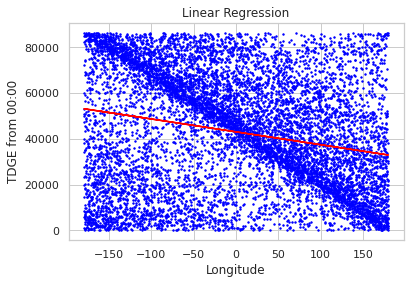

In [ ]:
dfX, dfy = df['Longitude'], df['TDGE_from_00:00']
from sklearn.model_selection import train_test_split
## train and test split
X_train, X_test, y_train, y_test = train_test_split(dfX, dfy, test_size=0.20)
X_train = np.array(X_train).reshape(-1,1)
from sklearn.linear_model import LinearRegression
lin = LinearRegression()
lin.fit(X_train, y_train)
plt.figure(figsize=)
plt.scatter(X_train, y_train, color = 'blue', s=2)
plt.plot(X_train, lin.predict(X_train), color='red')
plt.xlabel('Longitude')
plt.ylabel('TDGE from 00:00')
plt.title('Linear Regression');

Text(0.5, 1.0, 'Linear Regression')

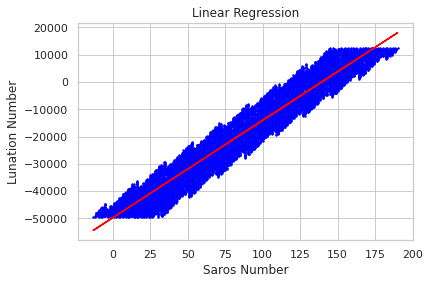

In [ ]:
dfX, dfy = df['Saros_Num'], df['Luna_Num']
from sklearn.model_selection import train_test_split
## train and test split
X_train, X_test, y_train, y_test = train_test_split(dfX, dfy, test_size=0.20)
X_train = np.array(X_train).reshape(-1,1)
from sklearn.linear_model import LinearRegression
lin = LinearRegression()
lin.fit(X_train, y_train)
plt.scatter(X_train, y_train, color = 'blue', s=2)
plt.plot(X_train, lin.predict(X_train), color='red')
plt.xlabel('Saros Number')
plt.ylabel('Lunation Number')
plt.title('Linear Regression')

In [ ]:
dfX, dfy = df['Saros_Num'], df['DT_(s)']
from sklearn.model_selection import train_test_split
## train and test split
X_train, X_test, y_train, y_test = train_test_split(dfX, dfy, test_size=0.20)
# X_train = np.array(X_train).reshape(-1,1)
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X_train)
poly.fit(X_poly, y_train)
plt.scatter(X_train, y_train, color = 'blue',s=2)
plt.plot(X_train, lin.predict(X_train), color='red')
plt.xlabel('Total Central Duration (s)')
plt.ylabel('Eclipse Magnitude')
plt.title('Linear Regression')

ValueError: ignored

# Clustering

In [ ]:
df1 = df.drop(['Eclipse_Type_2'], axis=1)
df2 = df1.drop(['Eclipse_Type'], axis=1)
df_final = df2.drop(['Eclipse_Type_1'], axis=1)

In [ ]:
# !pip install category_encoders
# import category_encoders as ce
# encoder= ce.OrdinalEncoder(cols=['Eclipse_Type_1'],return_df=True,
#                            mapping=[{'col':'Eclipse_Type_1',
# 'mapping':{'T':0,'A':1,'P':2,'H':3}}])

# df_transformed = encoder.fit_transform(df2)

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 4)
label = kmeans.fit_predict(df_final)

In [ ]:
label

array([2, 3, 3, ..., 1, 0, 0], dtype=int32)

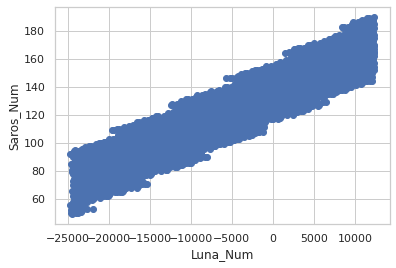

In [ ]:
#filter rows of original data
filtered_label0 = df_final[label == 0]
#plotting the results
plt.scatter(filtered_label0['Luna_Num'] , filtered_label0['Saros_Num']) # we are only plotting two parameters here for a 2D scatter plot.
plt.xlabel('Luna_Num')
plt.ylabel('Saros_Num')
plt.show()

Text(0.5, 1.0, 'Clusters for labels 1 and 3')

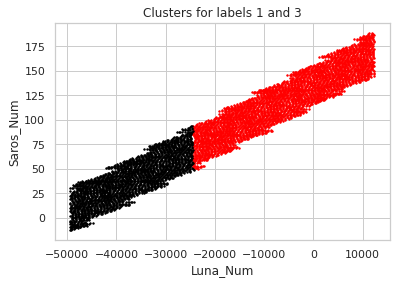

In [ ]:
#filter rows of original data
filtered_label1 = df_final[label==1]
 
filtered_label3 = df_final[label==3]
 
#Plotting the results
plt.scatter(filtered_label1['Luna_Num'] , filtered_label1['Saros_Num'] , color = 'red', s=2)
plt.scatter(filtered_label3['Luna_Num'] , filtered_label3['Saros_Num'] , color = 'black', s=2)
plt.xlabel('Luna_Num')
plt.ylabel('Saros_Num')
plt.title('Clusters for labels 1 and 3')

Text(0.5, 1.0, 'Clusters for all 4 labels together')

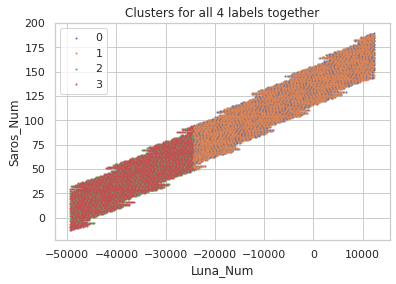

In [ ]:
u_labels = np.unique(label)
 
#plotting the results:
 
for i in u_labels:
    filtered_labeli = df_final[label==i]
    plt.scatter(filtered_labeli['Luna_Num'] , filtered_labeli['Saros_Num'], label = i, s=1)
plt.legend()
plt.xlabel('Luna_Num')
plt.ylabel('Saros_Num')
plt.title('Clusters for all 4 labels together')

Text(0.5, 1.0, 'Clusters for all 4 labels together')

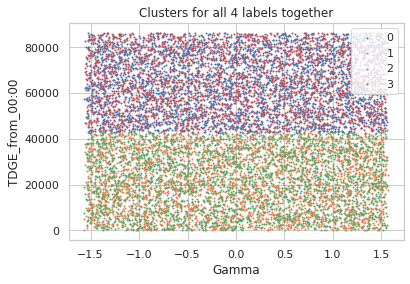

In [ ]:
u_labels = np.unique(label)
 
#plotting the results:
 
for i in u_labels:
    filtered_labeli = df_final[label==i]
    plt.scatter(filtered_labeli['Gamma'] , filtered_labeli['TDGE_from_00:00'], label = i, s=1)
plt.legend()
plt.xlabel('Gamma')
plt.ylabel('TDGE_from_00:00')
plt.title('Clusters for all 4 labels together')

# Pattern Emergence

In [ ]:
df.head()

,Canon_Plate,Year_(t=0@0AD),Month,Date,Days_from_the_last_eclipse,TDGE_from_00:00,DT_(s),Luna_Num,Saros_Num,Eclipse_Type_1,Eclipse_Type_2,Eclipse_Type,Gamma,Eclipse_Magnitude,Latitude,Longitude,Sun_Alt,Sun_Az,path_width,Total_Central_Duration_(s)
1,1.0,-1999.0,6.0,12.0,0.0,11691.0,46438.0,-49456.0,5.0,T,0,T,-0.2701,1.0733,6.0,-33.3,74.0,344.0,247.0,397.0
2,1.0,-1999.0,12.0,5.0,176.0,85523.0,46426.0,-49450.0,10.0,A,0,A,-0.2317,0.9382,-32.9,10.8,76.0,21.0,236.0,404.0
3,1.0,-1998.0,6.0,1.0,187.0,65356.0,46415.0,-49444.0,15.0,T,0,T,0.4994,1.0284,46.2,83.4,60.0,151.0,111.0,135.0
4,1.0,-1998.0,11.0,25.0,177.0,21423.0,46403.0,-49438.0,20.0,A,0,A,-0.9045,0.9806,-67.8,-143.8,25.0,74.0,162.0,74.0
5,1.0,-1997.0,4.0,22.0,217.0,47996.0,46393.0,-49433.0,-13.0,P,0,P,-1.4670,0.1611,-60.6,-106.4,0.0,281.0,0.0,0.0


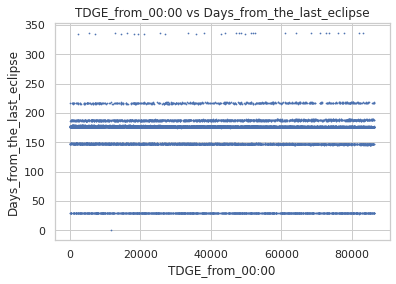

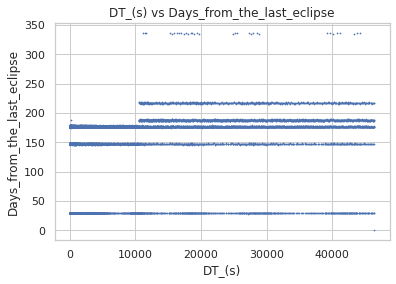

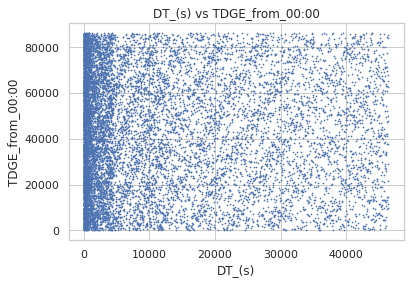

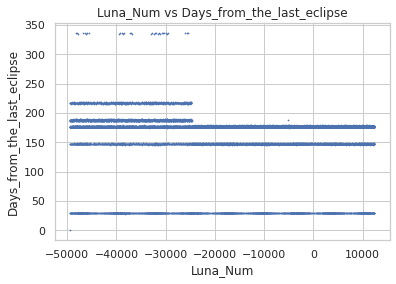

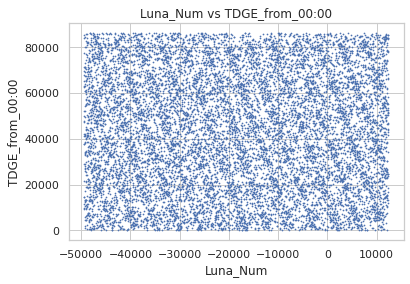

...

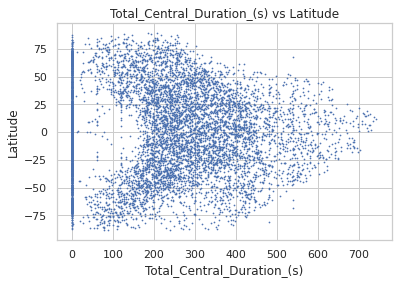

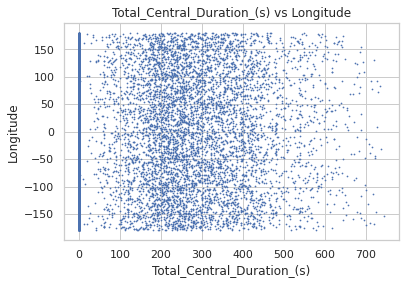

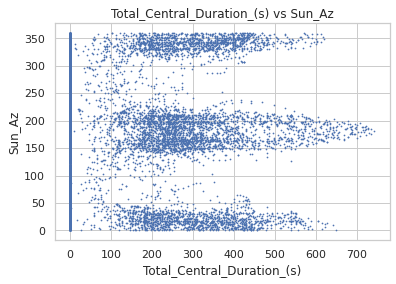

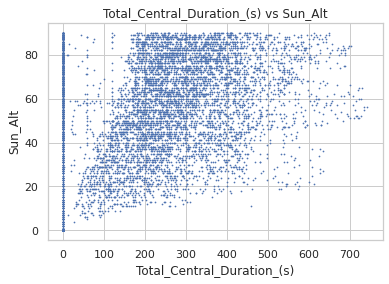

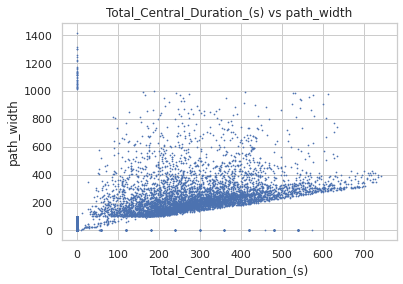

In [ ]:
#fig, ax = plt.subplots(13, 13, figsize=(169, 169))
counteri, counterj = 0, 0
for i in range(13):
  for j in range(i):
    plt.figure()
    plt.scatter(df[regression2[i]], df[regression2[j]], s=0.5)
    plt.title('%s vs %s' %(regression2[i], regression2[j]))
    plt.xlabel('%s'%regression2[i])
    plt.ylabel('%s'%regression2[j])
    plt.show()
    #ax[i, j].plot(df_heatmap[regression[i+j]], coffs[i+j]*df_heatmap[regression[i+j]])
    #ax[i, j].scatter(df_heatmap[regression[i+j]], dfy, marker='x', s=1 )
    #ax[i, j].set_title('Cent.Dur vs %s'%regression[i+j])